In [1]:
!pip uninstall ImmunoPheno --y
!pip install git+https://github.com/CamaraLab/ImmunoPheno.git@package-dev --q

Found existing installation: ImmunoPheno 0.1.0
Uninstalling ImmunoPheno-0.1.0:
  Successfully uninstalled ImmunoPheno-0.1.0


<H1>Tutorial 2: Normalizing CITE-seq data</H1>

In this tutorial, we demonstrate how to use the ImmunoPheno library to normalize the protein data from a CITE-seq dataset of human PBMCs including 38 antibodies. The data for this example is provided as an AnnData `.h5ad` [file](https://link.to.dropbox.com). In this file, empty droplets and cells that do not pass the quality controls have been already filtered out and the remaining cells have been annotated using standard software for single-cell RNA-seq data analysis such as [scanpy](https://scanpy.readthedocs.io/en/stable/), [Seurat](https://satijalab.org/seurat/), and [singleR](https://bioconductor.org/packages/release/bioc/html/SingleR.html).

In [2]:
import pandas as pd
import scanpy as sc
from immunopheno.data_processing import ImmunoPhenoData
from immunopheno.plots import plot_UMAP
from immunopheno.models import plot_all_fits, plot_ab_fit

pbmc = sc.read_h5ad("pbmc.h5ad")

/opt/conda/lib/python3.10/site-packages/immunopheno/data_processing.py:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
/opt/conda/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/conda/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.re

Note that the AnnData object contains both the gene and (unnormalized) protein expression data,

In [3]:
pbmc.var["feature_types"].value_counts()

Gene Expression     18753
Antibody Capture       38
Name: feature_types, dtype: int64

Cell identities were annotated using singleR and stored in the slot `'singler_names'`,

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


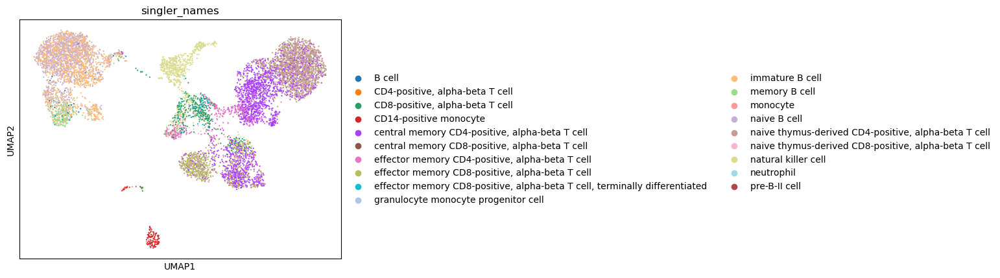

In [4]:
sc.pl.umap(pbmc, color=['singler_names'], size=10)

To normalize the protein data, we first create an `ImmunoPhenoData` instance. We can provide the ADT, gene expression, and cell annotation tables as `.csv` files or as pandas dataframes where each row corresponds to a cell. Alternatively, we can provide a `scanpy` (`AnnData`) object in the argument `scanpy=` of `ImmunoPhenoData`,

In [5]:
pbmc_ipd = ImmunoPhenoData(scanpy=pbmc, scanpy_labels = 'singler_names')

The antibody labels are stored in `protein.columns`:

In [6]:
pbmc_ipd.protein.columns

Index(['CD3', 'CD8', 'CD56', 'CD19-1', 'CD33-1', 'CD11c', 'CD123', 'CD4-1',
       'CD16', 'CD25', 'CD20', 'CD335', 'Podoplanin', 'IgM', 'HLA-DR', 'CD11b',
       'CD35', 'TCRab', 'CD163-1', 'CD83-1', 'CD38-1', 'CD127', 'Ep-CAM',
       'CD10', 'CD90', 'TCRrd', 'TCRVJ', 'CD206', 'CD117', 'CD279', 'IgD',
       'CD185', 'CD194', 'CD196', 'CD161', 'CD39', 'CD26', 'CD183'],
      dtype='object')

We use the function `fit_all_antibodies()` to fit 1- to 3-component mixture models for each antibody. For CITE-seq data we choose negative binomial components. The funtion then uses Akaike Information Criterion (AIC) to determine the best fit for each antibody, and assigns the first component as the background component, consisting of cells that do not express the corresponding antigen

In [7]:
pbmc_ipd.fit_all_antibodies(model="nb")

  0%|          | 0/38 [00:00<?, ?it/s]

Let us visually inspect all the fits

In [9]:
plot_ab_fit(pbmc_ipd, "CD4-1")

The red component represents the background. We can visually inspect the above fits and override the number of components or eliminate some antibodies from downstream analyses if we decide so. For example, we observe from that Podoplanin contain very little signal

In [14]:
plot_ab_fit(pbmc_ipd, "Podoplanin")

We may therefore decide to eliminate this antibody from downstream analyses,

In [15]:
pbmc_ipd.remove_antibody("Podoplanin")

Removed Podoplanin from protein data.
Removed Podoplanin fits.


In addition, looking at the corresponding plots for TCRVJ and CD163-1, we can observe that all the expression for these antibodies was classified as background, so we can also remove them from downstream analyses

In [27]:
pbmc_ipd.remove_antibody("TCRVJ")
pbmc_ipd.remove_antibody("CD163-1")

Removed TCRVJ from protein data.
Removed TCRVJ fits.
Removed CD163-1 from protein data.
Removed CD163-1 fits.


We can now use these fits to filter cells and normalize protein expression values. We may want to filter out cells that express most of the profiled proteins or a very small number of proteins. In this example, we will filter out cells expressing less than 10% of the profiled proteins (`bg_expr_threshold = 0.10`) or more than 75% of the profiled proteins (`sig_expr_threshold = 0.75`). In addition, ImmunoPheno can use the count data from cells that do not express a protein to model the background noise for that protein coming from non-specific antibody binding. To assess if there is a substantial amount of non-specific antibody binding, ImmunoPheno uses a linear regression model to test the association between antibody levels in cells that do not express the protein based on the mixture model fits and the total number of mRNA counts (as a proxy of cell size, and therefore cell surface) and the cell type. In this example, we choose to regress out these dependencies if the p-value resulting from these tests is smaller than 0.05 (`p_threshold = 0.05`). Finally, in the normalization model implemented in ImmunoPheno, the average expression level of a protein across cells expressing the protein is a parameter. In this example, we choose a separation of 2 standard deviations (`bg_cell_z_score = 2`) from the expression value of cells that do not express the protein (i.e. the zero expression). Putting all elements together, we have,

In [28]:
pbmc_ipd.normalize_all_antibodies(bg_expr_threshold = 0.10, sig_expr_threshold = 0.75, p_threshold = 0.05, bg_cell_z_score = 2)

  0%|          | 0/35 [00:00<?, ?it/s]

In total 211 cells have been filtered based on the aforementioned criteria. We can visualize the UMAP representation of the normalized protein expression space,

In [29]:
plot_UMAP(pbmc_ipd, normalized=True).update_traces(marker={'size': 2}).update_layout(autosize=False, width=1000, height=400)

As expected, mRNA cell populations appear more intermixed in the UMAP representation of the non-normalized protein expression data,

In [30]:
plot_UMAP(pbmc_ipd, normalized=False).update_traces(marker={'size': 2}).update_layout(autosize=False, width=1000, height=400)

Increasing the separation between the background and average protein expression will lead to a more fragmented normalized protein expression space,

In [31]:
pbmc_ipd.normalize_all_antibodies(bg_expr_threshold = 0.10, sig_expr_threshold = 0.75, p_threshold = 0.05, bg_cell_z_score = 10)
plot_UMAP(pbmc_ipd, normalized=True).update_traces(marker={'size': 2}).update_layout(autosize=False, width=1000, height=400)

  0%|          | 0/35 [00:00<?, ?it/s]

On the other hand, a more aggressive filtering will eliminate a larger number of cells

In [32]:
pbmc_ipd.normalize_all_antibodies(bg_expr_threshold = 0.15, sig_expr_threshold = 0.75, p_threshold = 0.05, bg_cell_z_score = 2)
plot_UMAP(pbmc_ipd, normalized=True).update_traces(marker={'size': 2}).update_layout(autosize=False, width=1000, height=400)

  0%|          | 0/35 [00:00<?, ?it/s]

Note that in this case we still have representation of all mRNA cell populations, and the mRNA cell populations appear better delimited in the UMAP representation, but 1263 cells have been filtered out from the dataset.

Once we have found a setting for the normalization parameters that we are happy with, we can save the filtered and normalized protein expression table as a `.csv` file, 

In [33]:
pbmc_ipd.normalized_counts.to_csv("pbmc_normalized_protein.csv")

or directly incorporate it into the scanpy object,

In [34]:
pbmc.protein = pbmc[pbmc_ipd.normalized_counts.index, pbmc_ipd.protein.columns]
pbmc.protein.X = pbmc_ipd.normalized_counts

Finally, we can visualize the normalized protein expression values in the mRNA UMAP representation,

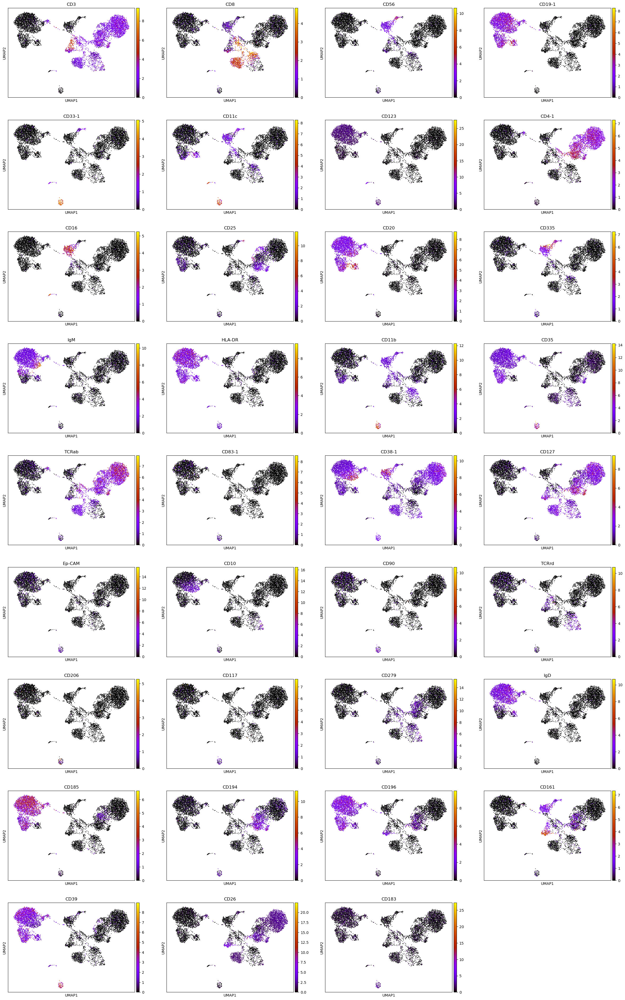

In [35]:
sc.pl.umap(pbmc.protein, color=pbmc_ipd.protein.columns, size=10, color_map = "gnuplot")